In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib agg

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import ipywidgets as widgets
import visualization
from utils import results, experiments, settings, equioutput

In [2]:
result = results.ResultSample.load_from_file(
    #"/home/gw/data/experiments/master_thesis/results/c6835cefcab68b58b6f07158f1137c83.tar.gz"
    "/home/gw/data/experiments/master_thesis/results/5fe59dd56f3ecc657fa49ac8b4ec4dce.tar.gz" # 4 * hidden, similarity!
    #"/home/gw/data/experiments/master_thesis/results/f47e4647c414e39d47e2d5b79a59ce1e.tar.gz" # 3 * hidden, similarity and invdist
    #"/home/gw/data/experiments/master_thesis/results/2ea0f0a8a17bbe618255d2787e7e7230.tar.gz"
    
)
experiment = experiments.FactoryExperiment(result.experiment_type, **{"settings": result.settings})()

normalized probabilities: [0.5665243  0.3504857  0.08298998]


In [3]:
print(experiment._settings)

SettingsExperimentSample(output_path='/u/halle/wiese/home_at/data/experiments/master_thesis/results', dataset='sinusoidal', dataset_normalization='standardization', hidden_layers=2, hidden_neurons=4, activation='tanh', activation_last_layer='none', num_warmup=1024, statistic='reduced', statistic_p=0.99, samples_per_chain=1, identifiable_modes=3, pool_size=16, seed=0)


In [4]:
sequential_helper = equioutput.SequentialHelper(
    transformation=experiment._model_transformation,
    dataset=experiment._dataset
)
structured_sequential_samples_parameters = sequential_helper.structured_sequential_samples_parameters(
    samples_parameters=result.samples["parameters"]
)

In [5]:
symmetry_helper = equioutput.SymmetryHelper(structured_sequential_samples_parameters)

In [6]:
print(sequential_helper._parameters_shapes)

FrozenDict({
    params: {
        layers_0: {
            bias: DeviceArray([4], dtype=int32),
            kernel: DeviceArray([1, 4], dtype=int32),
        },
        layers_2: {
            bias: DeviceArray([4], dtype=int32),
            kernel: DeviceArray([4, 4], dtype=int32),
        },
        layers_4: {
            bias: DeviceArray([1], dtype=int32),
            kernel: DeviceArray([4, 1], dtype=int32),
        },
    },
})


# initial status

In [7]:
subspace_0 = symmetry_helper.hidden_layer_subspace(layer=0)
subspace_1 = symmetry_helper.hidden_layer_subspace(layer=1)

In [8]:
data_list = list(subspace_0.transpose(1, 0, 2))

figure_1 = visualization.TriangleFigure(
    settings=settings.SettingsTriangleFigure(
        ax_width=2.0,
        ax_height=2.0,
        prefix=r"\theta",
        settings_scatter=settings.SettingsScatter(
            alpha=0.4,
            size=1.0
        )
    )
)
figure_plot_1 = figure_1.plot(
    data_list=data_list
)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.90it/s]


In [9]:
data_list = list(subspace_1.transpose(1, 0, 2))

figure_2 = visualization.TriangleFigure(
    settings=settings.SettingsTriangleFigure(
        ax_width=2.0,
        ax_height=2.0,
        prefix=r"\theta",
        settings_scatter=settings.SettingsScatter(
            alpha=0.4,
            size=1.0
        )
    )
)
figure_plot_2 = figure_2.plot(
    data_list=data_list
)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:01<00:00,  3.56it/s]


In [49]:
from matplotlib.backends.backend_agg import FigureCanvasAgg
canvas = FigureCanvasAgg(figure_plot_1)

In [64]:
import numpy as np
import PIL
canvas.draw()
size = figure_plot_1.get_size_inches() * figure_plot_1.get_dpi()
width, height = int(size[0]), int(size[1])
image = np.frombuffer(canvas.tostring_rgb(), dtype="uint8").reshape(width, height, 3)

image_widget = widgets.Image(value=canvas.tostring_rgb())
print(image_widget)

Image(value=b'\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff...')


In [77]:
import io
a = np.frombuffer(canvas.tostring_rgb(), dtype="uint8").reshape(width, height, 3)
f = io.BytesIO
PIL.Image.fromarray(a).save(f, 'png')

TypeError: descriptor 'write' for '_io.BytesIO' objects doesn't apply to a 'bytes' object

In [35]:
print(image.shape)

(1200, 1200, 3)


In [36]:
figure_plots = [figure_plot_1, figure_plot_2]
subspaces = [subspace_0, subspace_1]

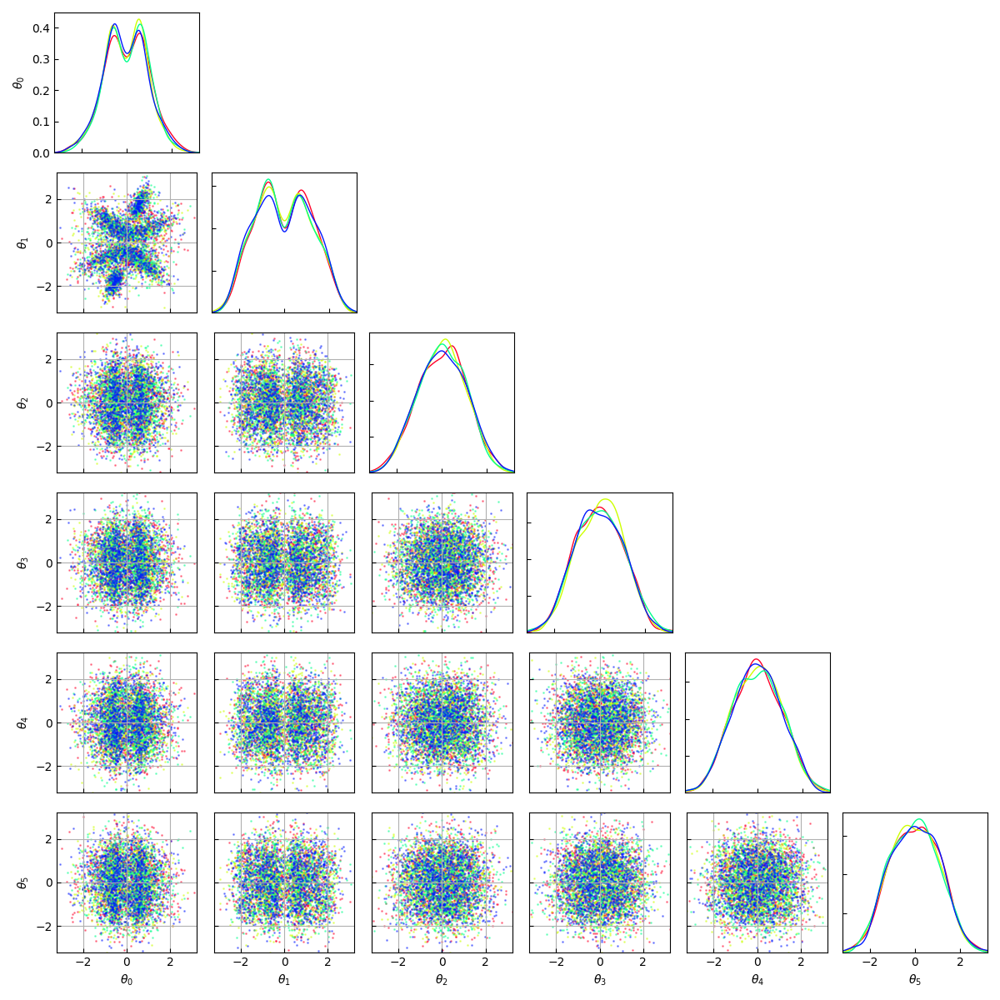

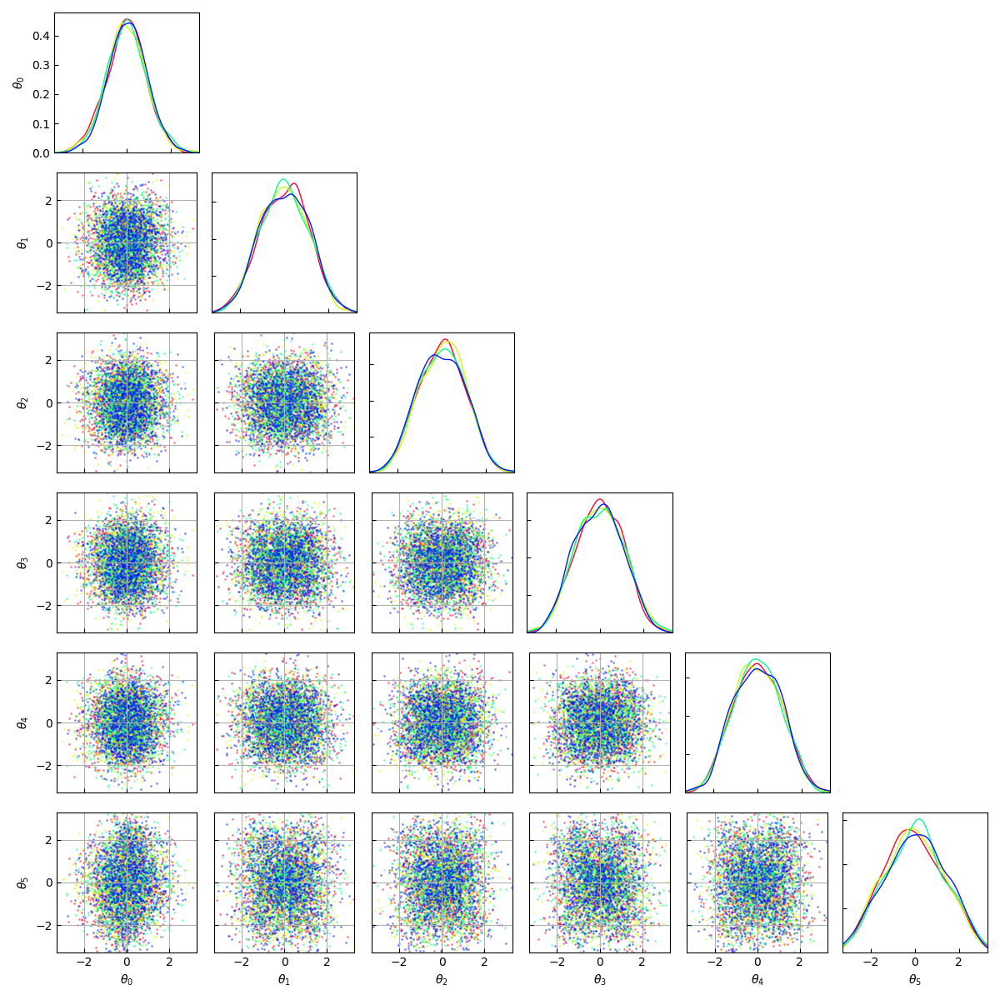

Tab()

In [79]:
children = []
for f in figure_plots:
    size = f.get_size_inches() * f.get_dpi()
    width, height = int(size[0]), int(size[1])
    canvas = FigureCanvasAgg(f)
    canvas.draw()
    image = np.frombuffer(canvas.tostring_rgb(), dtype="uint8").reshape(width, height, 3)
    #image_widget = widgets.Image(data=PIL.Image.fromarray(image))
    display(PIL.Image.fromarray(image))

tab = widgets.Tab(children=children)
#tab.children = children
tab.titles = [str(i) for i in range(len(children))]
tab

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:01<00:00,  3.75it/s]


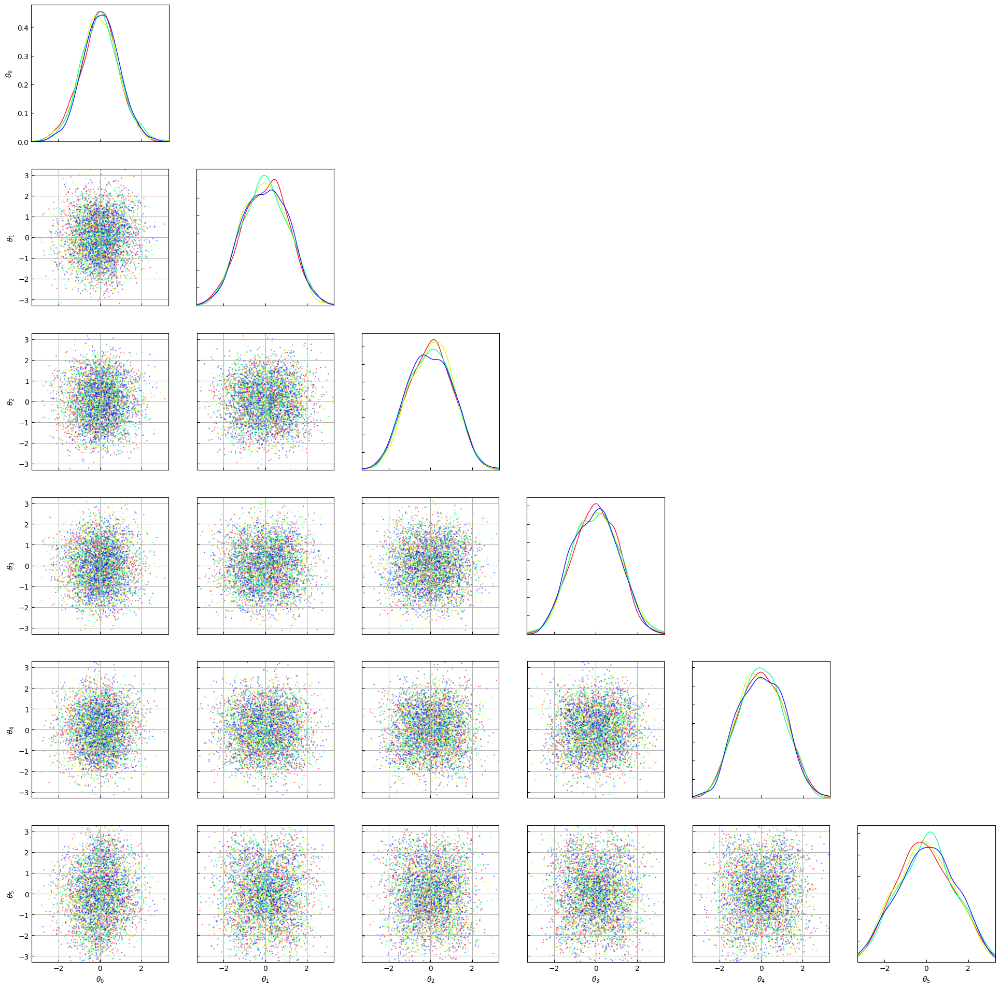

In [10]:
# remove symmetries layer 0
symmetry_helper.remove_tanh_symmetries(layer=0)

epoch: 0,  loss: 4.84395170211792, normal l2 norm: 2.8592841625213623
epoch: 1,  loss: 4.710968971252441, normal l2 norm: 2.355459451675415
epoch: 2,  loss: 4.091587066650391, normal l2 norm: 2.3231213092803955
epoch: 3,  loss: 3.9631106853485107, normal l2 norm: 2.472662925720215
epoch: 4,  loss: 3.5965218544006348, normal l2 norm: 2.191641092300415
epoch: 5,  loss: 3.6039206981658936, normal l2 norm: 2.154893159866333
epoch: 6,  loss: 3.5145375728607178, normal l2 norm: 2.1766979694366455
epoch: 7,  loss: 3.5182626247406006, normal l2 norm: 2.117767095565796
epoch: 8,  loss: 3.482196569442749, normal l2 norm: 2.065537452697754
epoch: 9,  loss: 3.4904603958129883, normal l2 norm: 2.0220861434936523
epoch: 10,  loss: 3.446291446685791, normal l2 norm: 2.0609023571014404
epoch: 11,  loss: 3.442399740219116, normal l2 norm: 2.03074312210083
epoch: 12,  loss: 3.4269485473632812, normal l2 norm: 2.059999465942383
epoch: 13,  loss: 3.4261550903320312, normal l2 norm: 2.010078191757202
epoch

In [ ]:
symmetry_helper._similarity_matrix = None
symmetry_helper.remove_permutation_symmetries(layer=0, iterations=128)

 59%|███████████████████████████████████████████████████████████████████████████████████████                                                            | 3019/5096 [00:11<00:08, 250.21it/s]

In [ ]:
# TODO: Maybe Spectral Classification greedy variant?
# TODO: Maybe standardize nodes again?

In [ ]:
subspace_0 = symmetry_helper.hidden_layer_subspace(layer=0)

In [ ]:
data = subspace_0.transpose(1, 0, 2)
print(data.shape)

figure = visualization.TriangleFigure(
    settings=settings.SettingsTriangleFigure(
        ax_width=4.0,
        ax_height=4.0,
        prefix=r"\theta",
        settings_scatter=settings.SettingsScatter(
            alpha=1.0,
            size=1.0
        )
    )
)
figure.plot(
    data_list=list(data)[:]
)

# permutation symmetry removal

In [15]:
bla = symmetry_helper._structured_sequential_samples_parameters.samples_parameters

figure = visualization.TriangleFigure(
    settings=settings.SettingsTriangleFigure(
        ax_width=4.0,
        ax_height=4.0,
        prefix=r"\theta",
        settings_scatter=settings.SettingsScatter(
            alpha=1.0,
            size=1.0
        )
    )
)
figure.plot(
    data_list=[bla]
)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:15<00:00,  2.10it/s]


samples_parameters_fs.shape (1274, 33)


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1024/1024 [00:04<00:00, 210.05it/s]


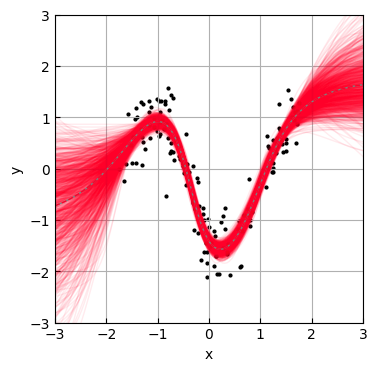

In [16]:
rng_key, rng_key_ = jax.random.split(jax.random.PRNGKey(0))
samples_parameters_fs = jax.random.permutation(rng_key_, bla)
print("samples_parameters_fs.shape", samples_parameters_fs.shape)

n = 2**10
if len(experiment._dataset.conditional_indices) > 1:
    n = 2**4

figure = visualization.RegressionFigure(
    settings=settings.SettingsRegressionFigure(
        settings_plot=settings.SettingsPlot(
            alpha=0.08,
            epistemic=False
        )
    )
)
figure.plot(
    dataset=experiment._dataset,
    transformation=experiment._model_transformation.apply_from_vector,
    parameters_list=[samples_parameters_fs[:n]],
    std=result.samples["std"].mean()
)